# Variational Monte Carlo simulation of Rydberg atoms

<br />

In this notebook, we show an application of recurrent neural networks (RNN) to discover the ground state of a many-body Hamiltonian. The RNN is used to parametrize the wavefunction of the Rydberg atoms, and its parameters are trained by minimizing the total energy using variational Monte Carlo. The RNN wavefunction and the training routines are implemented in the file `vmc.py`.

### Importing Tensorflow, Numpy, and Matplotlib 

In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tqdm import tqdm
import random

### RNN wavefunction

In [2]:
class VariationalMonteCarlo(tf.keras.Model):

    # Constructor
    def __init__(self, Lx, Ly, 
                 V, Omega, delta,
                 num_hidden, learning_rate,
                 epochs, seed=1234):
        
        super(VariationalMonteCarlo, self).__init__()

        """ PARAMETERS """
        self.Lx       = Lx              # Size along x
        self.Ly       = Ly              # Size along y
        self.V        = V               # Van der Waals potential
        self.Omega    = Omega           # Rabi frequency
        self.delta    = delta           # Detuning

        self.N        = Lx * Ly         # Number of spins
        self.nh       = num_hidden      # Number of hidden units in the RNN
        self.seed     = seed            # Seed of random number generator
        self.epochs   = epochs          # Training epochs 
        self.K        = 2               # Dimension of the local Hilbert space

        # Set the seed of the rng
        tf.random.set_seed(self.seed)

        # Optimizer
        self.optimizer = tf.optimizers.Adam(learning_rate, epsilon=1e-8)

        # Build the model RNN
        # RNN layer: N -> nh
        self.rnn = tf.keras.layers.GRU(self.nh, kernel_initializer='glorot_uniform',
                                       kernel_regularizer = tf.keras.regularizers.l2(0.001),
                                       return_sequences = True,
                                       return_state = True,
                                       stateful = False)

        # Dense layer: nh - > K
        self.dense = tf.keras.layers.Dense(self.K, activation = tf.nn.softmax,
                                           kernel_regularizer = tf.keras.regularizers.l2(0.001))

        # Generate the list of bonds for NN,NNN,NNNN on a 
        # square lattice with open boundaries
        self.buildlattice()
    
    @tf.function
    def sample(self,nsamples):
        # Zero initialization for visible and hidden state 
        inputs = 0.0*tf.one_hot(tf.zeros(shape=[nsamples,1],dtype=tf.int32),depth=self.K)
        hidden_state = tf.zeros(shape=[nsamples,self.nh])

        logP = tf.zeros(shape=[nsamples,],dtype=tf.float32)

        for j in range(self.N):
            # Run a single RNN cell
            rnn_output,hidden_state = self.rnn(inputs,initial_state=hidden_state)
            # Compute log probabilities
            probs = self.dense(rnn_output)
            log_probs = tf.reshape(tf.math.log(1e-10+probs),[nsamples,self.K])
            # Sample
            sample = tf.random.categorical(log_probs,num_samples=1)
            if (j == 0):
                samples = tf.identity(sample)
            else:
                samples = tf.concat([samples,sample],axis=1)
            # Feed result to the next cell
            inputs = tf.one_hot(sample,depth=self.K)
            add = tf.reduce_sum(log_probs*tf.reshape(inputs,(nsamples,self.K)),axis=1)

            logP = logP+tf.reduce_sum(log_probs*tf.reshape(inputs,(nsamples,self.K)),axis=1)

        return samples,logP

    @tf.function
    def logpsi(self,samples):
        # Shift data
        num_samples = tf.shape(samples)[0]
        data   = tf.one_hot(samples[:,0:self.N-1],depth=self.K)

        x0 = 0.0*tf.one_hot(tf.zeros(shape=[num_samples,1],dtype=tf.int32),depth=self.K)
        inputs = tf.concat([x0,data],axis=1)

        hidden_state = tf.zeros(shape=[num_samples,self.nh])
        rnn_output,_ = self.rnn(inputs,initial_state = hidden_state)
        probs        = self.dense(rnn_output)

        log_probs   = tf.reduce_sum(tf.multiply(tf.math.log(1e-10+probs),tf.one_hot(samples,depth=self.K)),axis=2)

        return 0.5*tf.reduce_sum(log_probs,axis=1)

    #@tf.function
    def localenergy(self,samples,logpsi):
        eloc = tf.zeros(shape=[tf.shape(samples)[0]],dtype=tf.float32)

        # Chemical potential
        for j in range(self.N):
            eloc += - self.delta * tf.cast(samples[:,j],tf.float32)
        # NN
        for n in range(len(self.nn)):
            eloc += self.V * tf.cast(samples[:,self.nn[n][0]]*samples[:,self.nn[n][1]],tf.float32)
        for n in range(len(self.nnn)):
            eloc += (self.V/8.0) * tf.cast(samples[:,self.nnn[n][0]]*samples[:,self.nnn[n][1]],tf.float32)
        for n in range(len(self.nnnn)):
            eloc += (self.V/64.0) * tf.cast(samples[:,self.nnnn[n][0]]*samples[:,self.nnnn[n][1]],tf.float32)

        # Off-diagonal part
        for j in range(self.N):
            flip_samples = np.copy(samples)
            flip_samples[:,j] = 1 - flip_samples[:,j]
            flip_logpsi = self.logpsi(flip_samples)
            eloc += -0.5*self.Omega * tf.math.exp(flip_logpsi-logpsi)

        return eloc

    """ Generate the square lattice structures """
    def coord_to_site(self,x,y):
        return self.Ly*x+y
    
    def buildlattice(self):
        self.nn = []
        self.nnn = []
        self.nnnn = []
        for x in range(self.Lx):
            for y in range(self.Ly-1):
                self.nn.append([self.coord_to_site(x,y),self.coord_to_site(x,y+1)])
        for y in range(self.Ly):
            for x in range(self.Lx-1):
                self.nn.append([self.coord_to_site(x,y),self.coord_to_site(x+1,y)])

        for y in range(self.Ly-1):
            for x in range(self.Lx-1):
                self.nnn.append([self.coord_to_site(x,y),self.coord_to_site(x+1,y+1)])
                self.nnn.append([self.coord_to_site(x+1,y),self.coord_to_site(x,y+1)])

        for y in range(self.Ly):
            for x in range(self.Lx-2):
                self.nnnn.append([self.coord_to_site(x,y),self.coord_to_site(x+2,y)])
        for y in range(self.Ly-2):
            for x in range(self.Lx):
                self.nnnn.append([self.coord_to_site(x,y),self.coord_to_site(x,y+2)])


### Define parameters

In [3]:
# Hamiltonian parameters
Lx = 4      # Linear size in x direction
Ly = 4      # Linear size in y direction
N = Lx*Ly   # Total number of atoms
V = 7.0     # Strength of Van der Waals interaction
Omega = 1.0 # Rabi frequency
delta = 1.0 # Detuning 

# RNN-VMC parameters
lr = 0.001     # learning rate of Adam optimizer
nh = 32        # Number of hidden units in the GRU cell
ns = 500       # Number of samples used to approximate the energy at each step
epochs = 1000  # Training iterations
seed = 1234    # Seed of RNG

# Exact energy from exact diagonalization
exact_energy = -0.45776822

### Upload QMC Data Files

In [4]:
from google.colab import files
uploaded = files.upload()


Saving samples_5.txt to samples_5.txt
Saving samples_4.txt to samples_4.txt
Saving samples_3.txt to samples_3.txt
Saving samples_2.txt to samples_2.txt
Saving samples_10.txt to samples_10.txt
Saving samples_1.txt to samples_1.txt


In [5]:
# uploaded

{'samples_1.txt': b'0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0\n0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0\n0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0\n0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 0\n0 0 1 0 1 0 0 1 0 1 0 0 1 0 1 0\n0 0 1 0 0 0 0 0 0 1 0 1 0 0 0 0\n0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0\n0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 1\n0 0 1 0 0 0 0 0 0 1 0 0 1 0 0 1\n0 0 0 0 1 0 0 1 0 1 0 0 1 0 0 0\n0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1\n0 0 1 0 0 0 0 1 0 1 0 0 1 0 0 1\n1 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1\n0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1\n0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 1\n0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0\n0 0 0 0 0 0 0 1 0 0 1 0 1 0 0 1\n0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1\n1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0\n0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 0\n0 1 0 0 1 0 0 0 0 0 1 0 1 0 0 1\n0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 1\n0 1 0 0 1 0 0 1 0 0 0 0 1 0 0 1\n0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 0\n0 0 1 0 1 1 0 1 0 0 0 0 1 0 0 0\n0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1\n0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0\n0 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0\n0 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0\n0 0 1 0 1 0 0 1 0 0 1 0

In [6]:
data = []
data_step_size = 100
for file in uploaded:
  new_data = uploaded[file].decode("utf-8").split("\n")[:-1] # last element is empty due to extra "\n"
  new_data = [list(map(int, entry.split())) for entry in new_data]
  new_data = new_data[::data_step_size]
  print(np.array(new_data).shape)
  data.extend(new_data)

(1000, 16)
(1000, 16)
(1000, 16)
(1000, 16)
(1000, 16)
(1000, 16)


In [7]:
#convert to tf.data.Dataset
data = np.array(data)
print(data.shape) #Num_examples, N
dataset = tf.data.Dataset.from_tensor_slices(data)

(6000, 16)


In [8]:

print("Running VMC for delta =",delta)
vmc = VariationalMonteCarlo(Lx,Ly,V,Omega,delta,nh,lr,epochs,seed)
energy = []
variance = []
for n in tqdm(range(1,epochs+1)):
    samples, _ = vmc.sample(ns)
    
    # Evaluate the loss function in AD mode
    with tf.GradientTape() as tape:
        logpsi = vmc.logpsi(samples)
        eloc = vmc.localenergy(samples, logpsi)
        Eo = tf.stop_gradient(tf.reduce_mean(eloc))

        loss = tf.reduce_mean(2.0*tf.multiply(logpsi, tf.stop_gradient(eloc)) - 2.0*Eo*logpsi)
    
    # Compute the gradients
    gradients = tape.gradient(loss, vmc.trainable_variables)
    
    # Update the parameters
    vmc.optimizer.apply_gradients(zip(gradients, vmc.trainable_variables))    
    
    energies = eloc.numpy()
    avg_E = np.mean(energies)/float(N)
    var_E = np.var(energies)/float(N)
    energy.append(avg_E)

Running VMC for delta = 1.0


100%|██████████| 1000/1000 [06:54<00:00,  2.41it/s]


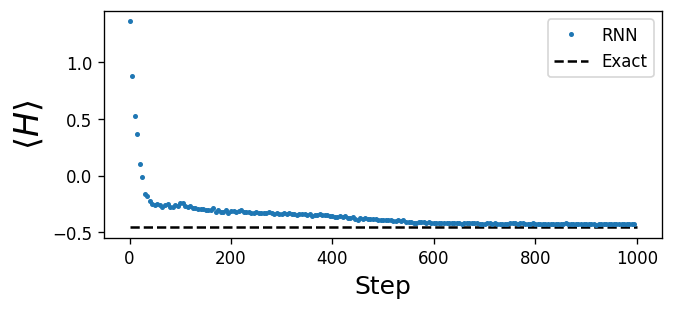

Final Error after 0.031827140145034793 epochs is 1000


In [9]:
fig = plt.figure(1,figsize=(6,2.5), dpi=120, facecolor='w', edgecolor='k')

plt.plot(energy,marker='o',markersize=2,linewidth=0.0,markevery=5,label="RNN")
plt.hlines(exact_energy,0,epochs,linestyle="--",label="Exact")

plt.xlabel("Step",fontsize=15)
plt.ylabel("$\\langle H \\rangle$",fontsize=20)
plt.legend(loc="best")

plt.show()
final_error = np.abs(energy[-1]-exact_energy)
print("Final Error after {} epochs is {}".format(final_error, epochs))

In [22]:
print("Running VMC for delta =",delta)
batch_size = 100
qmc_epochs = 30
vmc_qmc = VariationalMonteCarlo(Lx,Ly,V,Omega,delta,nh,lr,qmc_epochs,seed)
energy = []
variance = []
for n in tqdm(range(1,qmc_epochs+1)):
    samples, _ = vmc_qmc.sample(ns)
    
    # Evaluate the loss function in AD mode
    with tf.GradientTape() as tape:
        sample_logpsi = vmc_qmc.logpsi(samples)
        sample_eloc = vmc_qmc.localenergy(samples, sample_logpsi)
        sample_Eo = tf.stop_gradient(tf.reduce_mean(sample_eloc))

        sample_loss = tf.reduce_mean(2.0*tf.multiply(sample_logpsi, tf.stop_gradient(sample_eloc)) - 2.0*Eo*sample_logpsi)

    dset = dataset.shuffle(len(dataset))
    dset = dset.batch(batch_size, num_parallel_calls=5, deterministic=False)
    
    for i, batch in enumerate(dset):
      if i % 100 == 0:
        print("On Batch: ", i)
      # batch = tf.convert_to_tensor(batch)
      # Evaluate the loss function in AD mode
      with tf.GradientTape() as tape:
          logpsi = vmc_qmc.logpsi(batch)
          eloc = vmc_qmc.localenergy(batch, logpsi)
          Eo = tf.stop_gradient(tf.reduce_mean(eloc))

          loss = tf.reduce_mean(2.0*tf.multiply(logpsi, tf.stop_gradient(eloc)) - 2.0*Eo*logpsi)
      
      # Compute the gradients
      gradients = tape.gradient(loss, vmc_qmc.trainable_variables)
      
      # Update the parameters
      vmc_qmc.optimizer.apply_gradients(zip(gradients, vmc_qmc.trainable_variables))    
      
    energies = sample_eloc.numpy()
    avg_E = np.mean(energies)/float(N)
    var_E = np.var(energies)/float(N)
    energy.append(avg_E) #average over samples

Running VMC for delta = 1.0


  0%|          | 0/30 [00:00<?, ?it/s]

On Batch:  0


  3%|▎         | 1/30 [00:51<25:03, 51.84s/it]

On Batch:  0


  7%|▋         | 2/30 [01:33<21:18, 45.66s/it]

On Batch:  0


 10%|█         | 3/30 [01:55<15:49, 35.15s/it]

On Batch:  0


 13%|█▎        | 4/30 [02:37<16:17, 37.59s/it]

On Batch:  0


 17%|█▋        | 5/30 [03:18<16:13, 38.94s/it]

On Batch:  0


 20%|██        | 6/30 [03:59<15:53, 39.74s/it]

On Batch:  0


 23%|██▎       | 7/30 [04:41<15:26, 40.27s/it]

On Batch:  0


 27%|██▋       | 8/30 [05:22<14:53, 40.60s/it]

On Batch:  0


 30%|███       | 9/30 [05:45<12:14, 34.98s/it]

On Batch:  0


 33%|███▎      | 10/30 [06:26<12:18, 36.94s/it]

On Batch:  0


 37%|███▋      | 11/30 [07:07<12:07, 38.30s/it]

On Batch:  0


 40%|████      | 12/30 [07:49<11:45, 39.21s/it]

On Batch:  0


 43%|████▎     | 13/30 [08:30<11:17, 39.86s/it]

On Batch:  0


 47%|████▋     | 14/30 [08:53<09:16, 34.79s/it]

On Batch:  0


 50%|█████     | 15/30 [09:34<09:11, 36.76s/it]

On Batch:  0


 53%|█████▎    | 16/30 [10:16<08:54, 38.15s/it]

On Batch:  0


 57%|█████▋    | 17/30 [10:57<08:28, 39.10s/it]

On Batch:  0


 60%|██████    | 18/30 [11:38<07:57, 39.78s/it]

On Batch:  0


 63%|██████▎   | 19/30 [12:20<07:22, 40.25s/it]

On Batch:  0


 67%|██████▋   | 20/30 [13:01<06:45, 40.57s/it]

On Batch:  0


 70%|███████   | 21/30 [13:42<06:07, 40.81s/it]

On Batch:  0


 73%|███████▎  | 22/30 [14:24<05:27, 40.97s/it]

On Batch:  0


 77%|███████▋  | 23/30 [15:05<04:47, 41.09s/it]

On Batch:  0


 80%|████████  | 24/30 [15:46<04:06, 41.16s/it]

On Batch:  0


 83%|████████▎ | 25/30 [16:28<03:26, 41.21s/it]

On Batch:  0


 87%|████████▋ | 26/30 [17:09<02:44, 41.25s/it]

On Batch:  0


 90%|█████████ | 27/30 [17:32<01:46, 35.65s/it]

On Batch:  0


 93%|█████████▎| 28/30 [18:13<01:14, 37.36s/it]

On Batch:  0


 97%|█████████▋| 29/30 [18:54<00:38, 38.56s/it]

On Batch:  0


100%|██████████| 30/30 [19:36<00:00, 39.21s/it]


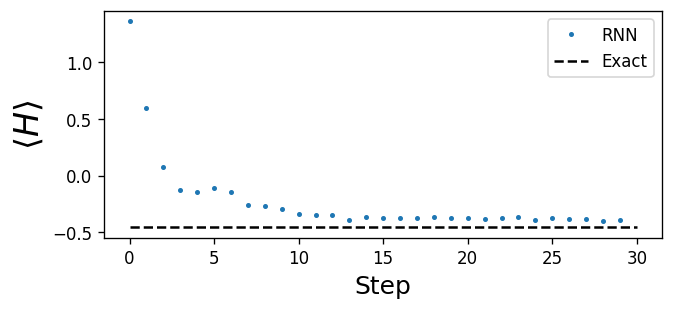

Final Error after 0.06631626515838623 epochs is 30


In [24]:
fig = plt.figure(1,figsize=(6,2.5), dpi=120, facecolor='w', edgecolor='k')

plt.plot(energy,marker='o',markersize=2,linewidth=0.0,markevery=1,label="RNN")
plt.hlines(exact_energy,0,qmc_epochs,linestyle="--",label="Exact")

plt.xlabel("Step",fontsize=15)
plt.ylabel("$\\langle H \\rangle$",fontsize=20)
plt.legend(loc="best")

plt.show()
final_error = np.abs(energy[-1]-exact_energy)
print("Final Error after {} epochs is {}".format(final_error, qmc_epochs))

In [25]:
print("Running VMC for delta =",delta)
epochs = 970
for n in tqdm(range(1,epochs+1)):
    samples, _ = vmc_qmc.sample(ns)
    
    # Evaluate the loss function in AD mode
    with tf.GradientTape() as tape:
        logpsi = vmc_qmc.logpsi(samples)
        eloc = vmc_qmc.localenergy(samples, logpsi)
        Eo = tf.stop_gradient(tf.reduce_mean(eloc))

        loss = tf.reduce_mean(2.0*tf.multiply(logpsi, tf.stop_gradient(eloc)) - 2.0*Eo*logpsi)
    
    # Compute the gradients
    gradients = tape.gradient(loss, vmc_qmc.trainable_variables)
    
    # Update the parameters
    vmc_qmc.optimizer.apply_gradients(zip(gradients, vmc_qmc.trainable_variables))    
    
    energies = eloc.numpy()
    avg_E = np.mean(energies)/float(N)
    var_E = np.var(energies)/float(N)
    energy.append(avg_E)

Running VMC for delta = 1.0


100%|██████████| 970/970 [06:36<00:00,  2.45it/s]


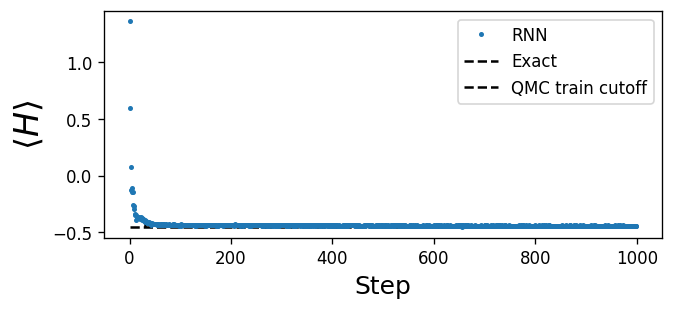

Final Error after 0.01260368853065491 epochs is 1000


In [26]:
fig = plt.figure(1,figsize=(6,2.5), dpi=120, facecolor='w', edgecolor='k')

plt.plot(energy,marker='o',markersize=2,linewidth=0.0,markevery=1,label="RNN")
plt.hlines(exact_energy,0,epochs+qmc_epochs,linestyle="--",label="Exact")
plt.vlines(qmc_epochs, -0.4, exact_energy, linestyle="--", label="QMC train cutoff")

plt.xlabel("Step",fontsize=15)
plt.ylabel("$\\langle H \\rangle$",fontsize=20)
plt.legend(loc="best")

plt.show()
final_error = np.abs(energy[-1]-exact_energy)
print("Final Error after {} epochs is {}".format(final_error, epochs+qmc_epochs))